<a href="https://colab.research.google.com/github/elee190/forage_pro/blob/main/forapro_monarch_viceroy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! [ -e /content ] && pip install -Uqq fastbook

import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.6/536.6 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.3/38.3 MB 40.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ibis-framework 7.1.0 requires pyarrow<15,>=2, but you have pyarrow 15.0.0 which is incompatible.
Mounted at /content/gdrive


In [ ]:
key = os.environ.get('AZURE_SEARCH_KEY','fe2e37cf220641c1a3359a1f7213f3e2')

In [ ]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [ ]:
results = search_images_bing(key, 'monarch butterfly')
ims = results.attrgot('contentUrl')
len(ims)

150

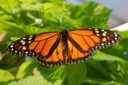

In [ ]:
dest = 'images/monarch.jpg'

download_url(ims[0], dest)

im = Image.open(dest)
im.to_thumb(128, 128)

In [ ]:
bfly_types = 'monarch', 'viceroy', 'queen danaus'

path = Path('bflys')

if not path.exists():
  path.mkdir()
  for o in bfly_types:
    dest = (path/o)
    dest.mkdir(exist_ok = True)
    results = search_images_bing(key, f'{o} butterfly')
    download_images(dest, urls= results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path)
fns

(#374) [Path('bflys/viceroy/e429ea74-5f40-41b4-a554-b7fa160b29b2.jpg'),Path('bflys/viceroy/8b35c5ce-62ad-433c-9bee-e73ef516f0b3.jpg'),Path('bflys/viceroy/324c7d5c-05eb-4002-8bf2-0e5bf3234e7c.jpg'),Path('bflys/viceroy/df714cc1-88b6-468f-a418-3fe22b6f99dc.jpg'),Path('bflys/viceroy/f19383ec-e978-479d-b690-25b1ecf77fb5.jpg'),Path('bflys/viceroy/f24144e0-6bcb-4539-892c-06e5c1c9bfc2.jpg'),Path('bflys/viceroy/013c305f-95f8-4d3a-bedb-5a434573ff2a.jpg'),Path('bflys/viceroy/12b22336-51a1-487f-a4f5-ba83b628b52b.png'),Path('bflys/viceroy/d1e8750d-9606-40e6-9aac-3d6520be4bd6.jpg'),Path('bflys/viceroy/4249dcc5-965e-42d8-8294-3aae3a870435.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#5) [Path('bflys/monarch/ce5e85e6-f8c8-4cbb-acb5-d853d8d11764.jpg'),Path('bflys/monarch/df4a8ec4-ffde-4952-96ed-d0157da0302e.jpg'),Path('bflys/monarch/90b7a813-a30a-468a-a8f1-3452742f7440.jpg'),Path('bflys/queen danaus/ca32fa4d-22d8-4bf3-980e-eae9ff0ceaef.jpg'),Path('bflys/queen danaus/e6dc7ba7-1ebc-4be1-ae7c-9700211babdd.jpg')]

In [ ]:
failed.map(Path.unlink);

In [ ]:
bflys = DataBlock(blocks = (ImageBlock, CategoryBlock), get_items = get_image_files,
                  splitter = RandomSplitter(valid_pct = 0.2, seed = 42), get_y = parent_label,
                  item_tfms = Resize(128))

In [ ]:
dls = bflys.dataloaders(path)

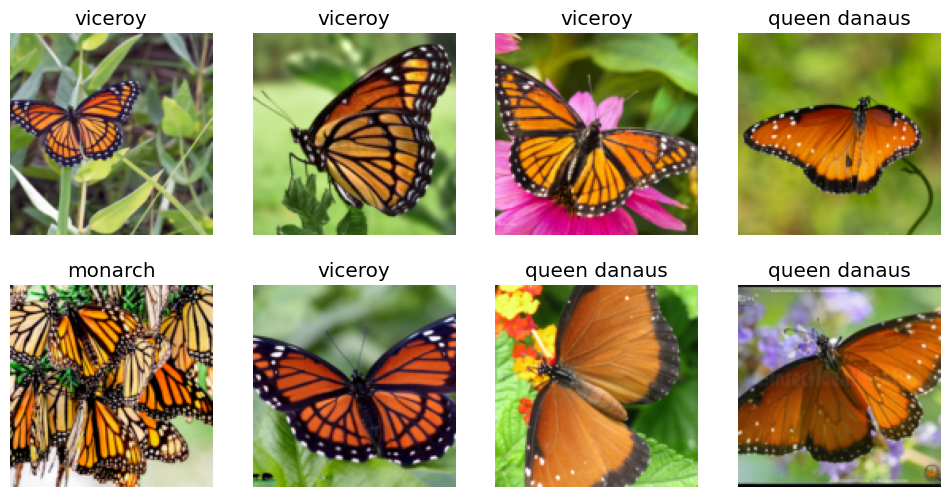

In [ ]:
dls.valid.show_batch(max_n = 8, nrows = 2)

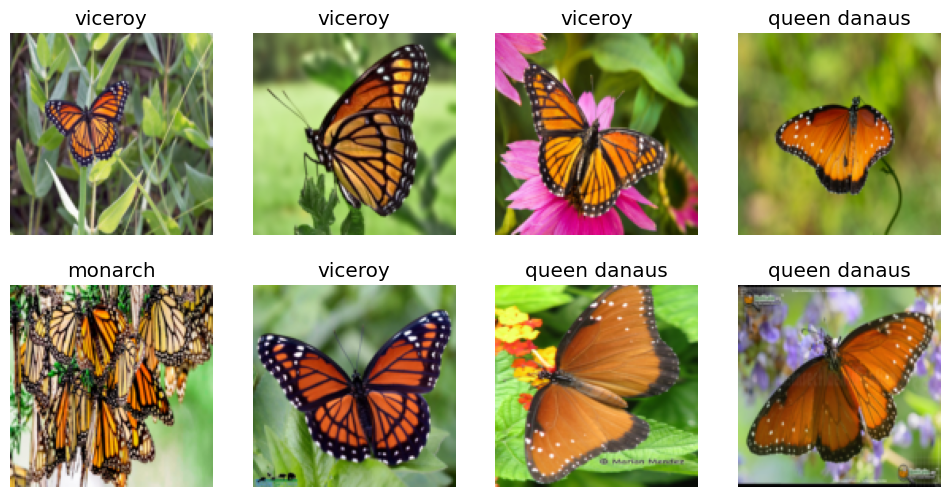

In [ ]:
bflys = bflys.new(item_tfms = Resize(128, ResizeMethod.Squish))
dls = bflys.dataloaders(path)
dls.valid.show_batch(max_n = 8, nrows = 2)

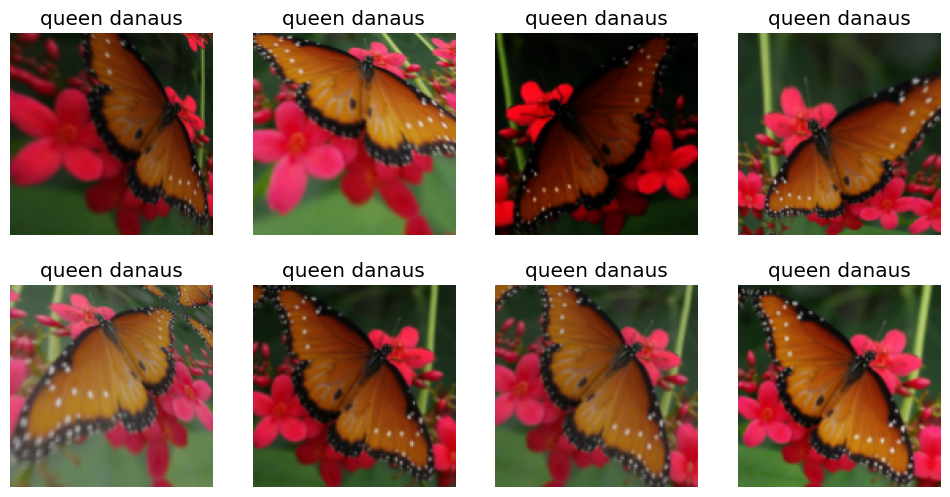

In [ ]:
bflys = bflys.new(item_tfms = Resize(128), batch_tfms = aug_transforms(mult = 2))
dls = bflys.dataloaders(path)
dls.train.show_batch(max_n = 8, nrows = 2, unique = True)

In [ ]:
bflys = bflys.new(item_tfms = RandomResizedCrop(224, min_scale = 0.5), batch_tfms = aug_transforms())
dls = bflys.dataloaders(path)

In [ ]:
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 165MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.880080,2.262395,0.575342,00:14


epoch,train_loss,valid_loss,error_rate,time
0,1.097807,1.103498,0.424658,00:13
1,0.912873,0.530876,0.191781,00:15
2,0.757656,0.434982,0.123288,00:14
3,0.679403,0.431314,0.123288,00:13


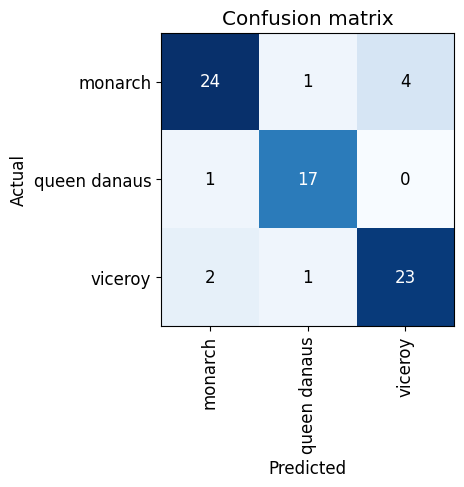

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

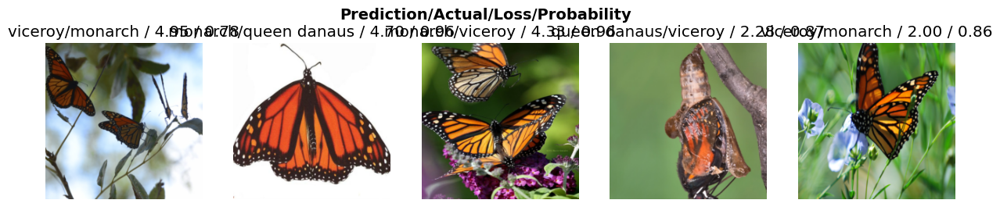

In [ ]:
interp.plot_top_losses(5, nrows = 1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for i in cleaner.delete():
  cleaner.fns[i].unlink()

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')
learn_inf.predict('images/monarch.jpg')

('monarch', tensor(0), tensor([0.9453, 0.0368, 0.0179]))

In [ ]:
learn_inf.dls.vocab

['monarch', 'queen danaus', 'viceroy']

### App GUI

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
btn_upload = SimpleNamespace(data = ['images/monarch.jpg'])
img = PILImage.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl:
  display(img.to_thumb(128, 128))

out_pl

Output()

In [ ]:
pred, pred_idx, probs = learn_inf.predict(img)

lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: monarch; Probability: 0.9453')

In [ ]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl:
    display(img.to_thumb(128, 128))
  pred, pred_idx, probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probablity: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
btn_upload = widgets.FileUpload()

VBox([widgets.Label('Select your butterfly'), btn_upload, btn_run, out_pl, lbl_pred])